# **Data Preprocessing**

In [4]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /content/Data/cats_and_dogs_filtered.zip

--2024-03-19 11:57:47--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.197.207, 74.125.135.207, 173.194.203.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.197.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/content/Data/cats_and_dogs_filtered.zip’

/content/Data/cats_ 100%[===================>]  65.43M   261MB/s    in 0.3s    

2024-03-19 11:57:47 (261 MB/s) - ‘/content/Data/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [5]:
import os
import cv2

import zipfile
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf
from tensorflow.keras.layers import Flatten, Dense, MaxPooling2D, Conv2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential


In [6]:
local_zip = '/content/Data/cats_and_dogs_filtered.zip'
zipref = zipfile.ZipFile(local_zip)
zipref.extractall('/content/Data')

In [7]:
os.listdir('/content/Data/cats_and_dogs_filtered')

['vectorize.py', 'validation', 'train']

In [8]:
print(os.listdir('/content/Data/cats_and_dogs_filtered/train'))
print(os.listdir('/content/Data/cats_and_dogs_filtered/validation'))

['cats', 'dogs']
['cats', 'dogs']


In [9]:
print(os.listdir('/content/Data/cats_and_dogs_filtered/train/cats')[:5])
print(os.listdir('/content/Data/cats_and_dogs_filtered/train/dogs')[:5])

['cat.210.jpg', 'cat.509.jpg', 'cat.874.jpg', 'cat.448.jpg', 'cat.763.jpg']
['dog.828.jpg', 'dog.425.jpg', 'dog.518.jpg', 'dog.685.jpg', 'dog.952.jpg']


In [10]:
base_dir = '/content/Data/cats_and_dogs_filtered'
train_dir = '/content/Data/cats_and_dogs_filtered/train'
val_dir = '/content/Data/cats_and_dogs_filtered/validation'

train_cat_dir = '/content/Data/cats_and_dogs_filtered/train/cats'
train_dog_dir = '/content/Data/cats_and_dogs_filtered/train/dogs'

val_cat_dir = '/content/Data/cats_and_dogs_filtered/validation/cats'
val_dog_dir = '/content/Data/cats_and_dogs_filtered/validation/dogs'

# **Exploratory Data Analysis**

In [11]:
print('Number of training cat images   : ', len(os.listdir(train_cat_dir)))
print('Number of training dog images   : ', len(os.listdir(train_dog_dir)))
print()
print('Number of validation cat images : ', len(os.listdir(val_cat_dir)))
print('Number of validation dog images : ', len(os.listdir(val_dog_dir)))

Number of training cat images   :  1000
Number of training dog images   :  1000

Number of validation cat images :  500
Number of validation dog images :  500


In [12]:
print(os.listdir(train_cat_dir)[:5])
print(os.listdir(train_dog_dir)[:5])
print(os.listdir(val_cat_dir)[:5])
print(os.listdir(val_dog_dir)[:5])

['cat.210.jpg', 'cat.509.jpg', 'cat.874.jpg', 'cat.448.jpg', 'cat.763.jpg']
['dog.828.jpg', 'dog.425.jpg', 'dog.518.jpg', 'dog.685.jpg', 'dog.952.jpg']
['cat.2000.jpg', 'cat.2185.jpg', 'cat.2338.jpg', 'cat.2360.jpg', 'cat.2184.jpg']
['dog.2211.jpg', 'dog.2155.jpg', 'dog.2107.jpg', 'dog.2238.jpg', 'dog.2325.jpg']


(-0.5, 349.5, 263.5, -0.5)

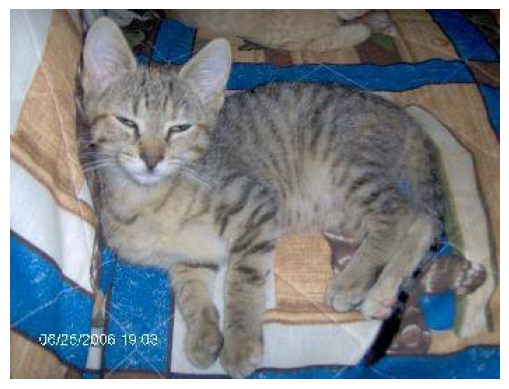

In [13]:
cat_img_path = os.path.join(train_cat_dir,'cat.819.jpg')
cat_img = mpimg.imread(cat_img_path)
plt.imshow(cat_img)
plt.axis('off')

(-0.5, 499.5, 373.5, -0.5)

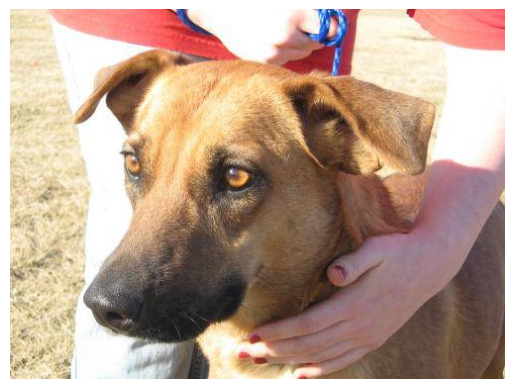

In [14]:
dog_img_path = os.path.join(train_dog_dir,'dog.123.jpg')
dog_img = mpimg.imread(dog_img_path)

plt.imshow(dog_img)
plt.axis('off')

In [15]:
print(cat_img_path)
print(dog_img_path)

/content/Data/cats_and_dogs_filtered/train/cats/cat.819.jpg
/content/Data/cats_and_dogs_filtered/train/dogs/dog.123.jpg


In [16]:
cat_images = os.listdir(train_cat_dir)[:50]
dog_images = os.listdir(train_dog_dir)[:50]

cat_images_path = [os.path.join(train_cat_dir,img) for img in cat_images]
dog_images_path = [os.path.join(train_dog_dir,img) for img in dog_images]

images_path = cat_images_path + dog_images_path
print(len(images_path))

100


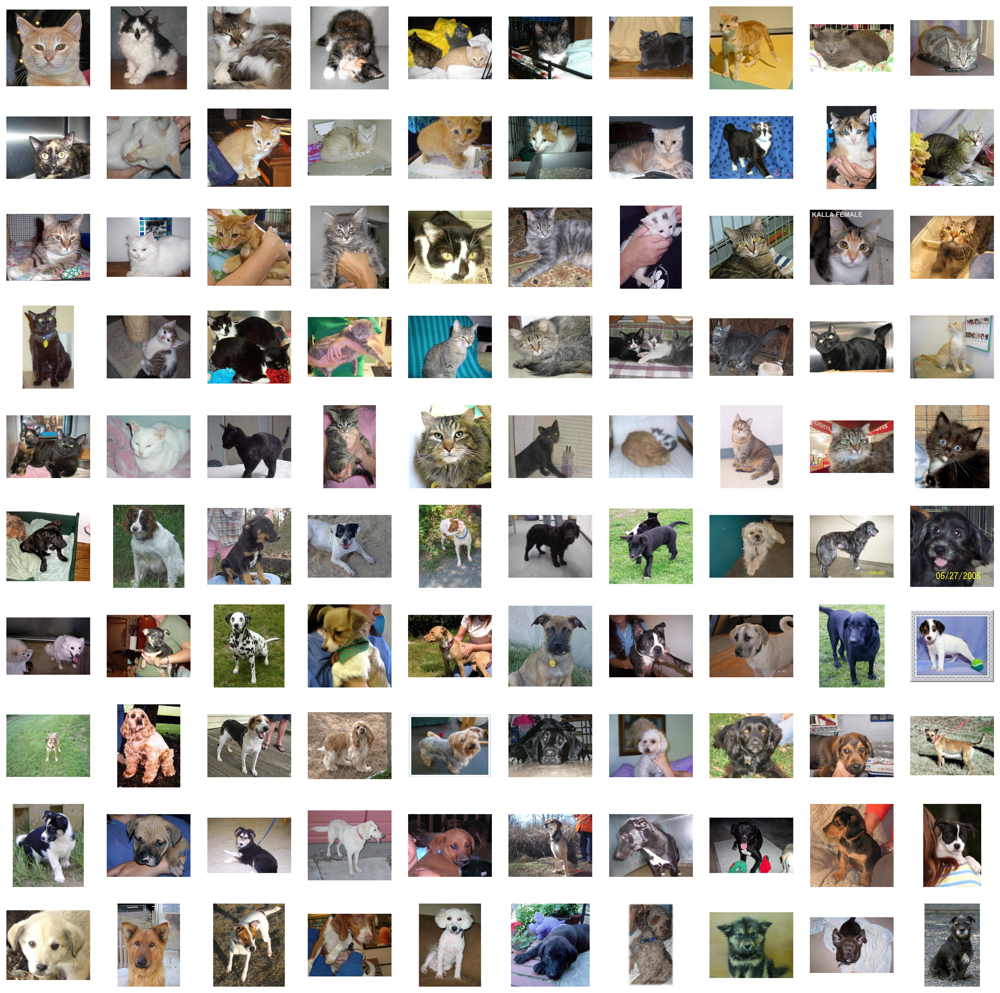

In [17]:
plt.figure(figsize=(20,20),dpi=200)

for i in range(100):
  plt.subplot(10,10,i+1)
  img = mpimg.imread(images_path[i])
  plt.imshow(img)
  plt.axis('off')

# **Model Traning**

In [18]:
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 0.2,
    zoom_range = 0.2,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.1,
    vertical_flip = True,
    horizontal_flip = True
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    batch_size = 50,
    target_size = (200,200),
    class_mode = 'binary'
)

Found 2000 images belonging to 2 classes.


In [19]:
val_datagen = ImageDataGenerator(rescale=1/255)
val_generator = val_datagen.flow_from_directory(
    val_dir,
    batch_size = 50,
    target_size = (200,200),
    class_mode = 'binary'
)

Found 1000 images belonging to 2 classes.


In [20]:
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 99, 99, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 48, 48, 64)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 147456)            0         
                                                                 
 dense (Dense)               (None, 64)                9

In [21]:
model.compile(
    loss = 'binary_crossentropy',
    optimizer = Adam(),
    metrics = ['accuracy']
)

In [23]:
history = model.fit(
    train_generator,
    validation_data = (val_generator),
    epochs = 50,
    verbose=1
)

Epoch 1/50
40/40 [==============================] - 28s 530ms/step - loss: 0.7480 - accuracy: 0.5245 - val_loss: 0.6896 - val_accuracy: 0.5610
Epoch 2/50
40/40 [==============================] - 23s 570ms/step - loss: 0.6851 - accuracy: 0.5345 - val_loss: 0.6974 - val_accuracy: 0.5340
Epoch 3/50
40/40 [==============================] - 23s 564ms/step - loss: 0.6779 - accuracy: 0.5695 - val_loss: 0.6590 - val_accuracy: 0.6020
Epoch 4/50
40/40 [==============================] - 23s 573ms/step - loss: 0.6592 - accuracy: 0.5865 - val_loss: 0.6615 - val_accuracy: 0.6260
Epoch 5/50
40/40 [==============================] - 22s 547ms/step - loss: 0.6446 - accuracy: 0.6095 - val_loss: 0.6470 - val_accuracy: 0.6110
Epoch 6/50
40/40 [==============================] - 23s 561ms/step - loss: 0.6508 - accuracy: 0.6135 - val_loss: 0.6364 - val_accuracy: 0.6370
Epoch 7/50
40/40 [==============================] - 23s 576ms/step - loss: 0.6316 - accuracy: 0.6265 - val_loss: 0.6370 - val_accuracy: 0.6440

# **Model Evaluation**

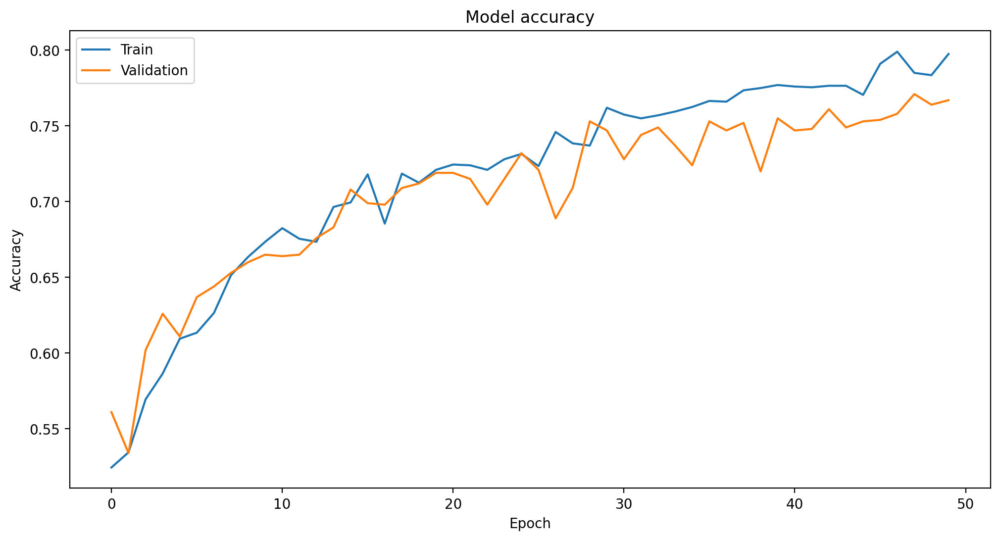

In [24]:
plt.figure(figsize=(12,6), dpi=200)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

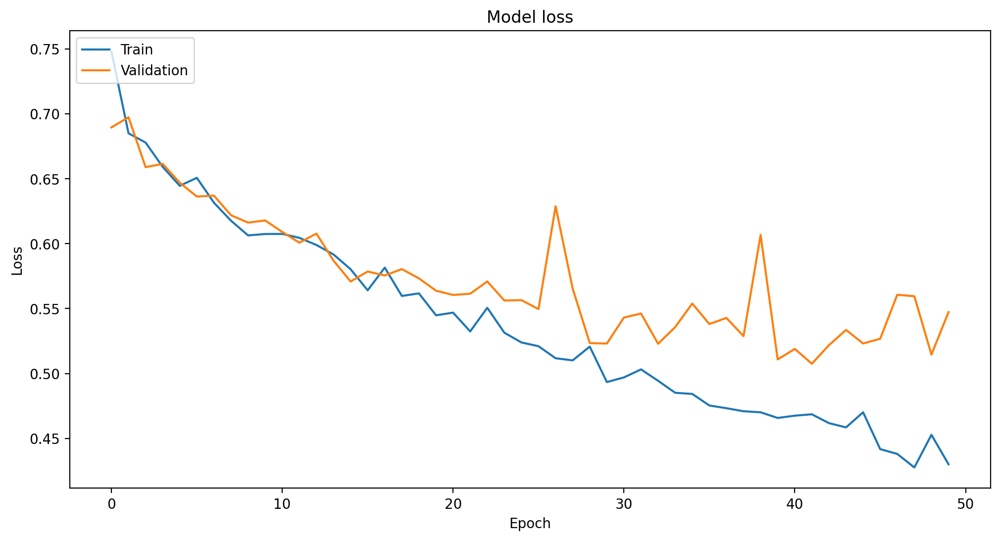

In [25]:
plt.figure(figsize=(12,6), dpi=200)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()